# EDA

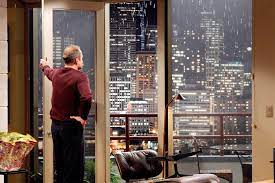

## Importing the Libraries

import all the libraries we need for our future work.

In [1]:
import warnings

warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geojson
import plotly.express as px




from matplotlib.ticker import PercentFormatter
plt.rcParams.update({ "figure.figsize" : (8, 5),"axes.facecolor" : "white", "axes.edgecolor":  "black"})
plt.rcParams["figure.facecolor"]= "w"
pd.plotting.register_matplotlib_converters()
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [2]:
# Loading of the dataset via pandas
kc_df = pd.read_csv("data/King_County_House_prices_dataset.csv")

In [3]:
# We look at a random sample of our data set.
# We want to make sure that the data has been read in correctly.
kc_df.sample(5)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
18937,1753500100,7/9/2014,309000.000,3,2.250,1980,8755,1.000,0.000,0.000,...,7,1300,680.0,1963,0.000,98198,47.392,-122.321,2030,8671
13135,3693900155,9/5/2014,950000.000,6,1.000,2330,5000,1.500,NaN,0.000,...,7,2330,0.0,1920,NaN,98117,47.679,-122.397,1570,5000
16838,6431500122,4/28/2015,520000.000,3,1.500,1580,8841,1.500,0.000,0.000,...,7,1180,400.0,1923,0.000,98103,47.693,-122.352,1580,7512
18599,993002225,6/23/2014,405000.000,3,2.250,1520,1245,3.000,NaN,0.000,...,8,1520,0.0,2004,0.000,98103,47.691,-122.340,1520,1470
3113,4047200850,4/2/2015,387000.000,3,1.500,1620,21929,2.000,0.000,0.000,...,7,1620,0.0,1990,0.000,98019,47.767,-121.903,1600,21679


## Business Understanding

King County is located in the center of the Seattle metropolitan region

In [4]:
kc_df["view"].unique()

array([ 0., nan,  3.,  4.,  2.,  1.])

The dataset, contains data on all property sales in King County from May 2014 to May 2015.

|**Column Names**   |  **Description** |
|---                |---:               |
| id                | unique identified for a house  | 
| dateDate              | date the house was sold  |
| pricePrice             | price for each house  |
| bedroomsNumber          | number of bedrooms  |
| bathroomsNumber         | number of bathrooms,  where .5 stands for a room with a toilet but no shower  |
| sqft_livingsquare       | square footage of the house’s interior living space  |
| sqft_lotsquare          | square footage of the land space   |
| floors            | number of floors  |
| waterfront        | Has the house on the water view? 0-No 1-Yes  |
| view              | An index from 0 to 4 indicating how good the survey of the property was  |
| condition         | An index from 1 to 5 for the condition of the flat,1 - lowest, 5 - highest  |
| grade             |  An index of 1 to 13, where 1-3 lags behind construction and design of buildings, 7 shows an average level of construction and design and 11-13 shows a high level of quality of construction and design. |
| sqft_above        | square feet above ground |
| sqft_basement     | square footage of the basement  |
| yr_built          | The year in which the house was originally built |
| yr_renovated      | The year of the last renovation of the house   |
| zipcode           | In which zipcode area is the house located  |
| lat               | latitude  |
| long              | logitude  |
| sqft_living15     | average size of interior housing living space for the closest 15 houses, in square feet  |
| sqft_lot15        | average size of land lot for the closest 15 houses, in square feet  |

## Understand the Data
After we have loaded the data successfully, we need a general overview of the overall quality of the data.

For this reason we would like to answer a few questions:
- How many house sales are in our data set?
- What datatype are in the data?
- Are there any missing values?
- Which features are continuous or categorical
- How many values are there for the individual variables?

____________________________________________________

__1. How many house sales are in our data set?__

In [5]:
kc_df.shape

(21597, 21)

Each row contains the details of one house sale:
    
21597 house sales are included in our dataset and 20 different details about these houses

__2. What datatype are in the data?__

In [6]:
kc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

**Data-types**  
- The dataset contains 8 columns with float64 numbers, 11 columns with int64 numbers and 2 columns with object (text). <br>

- We expect that all information about the size of the area, the number of rooms, and the rating about the location will be given as numbers.

- For information about certain things that the house brings with it, such as a view, a boolean would have been expected which, however, can also make the same statement with numbers from 0 to 1. 

- The date was recognized as text and also the information about the sqft basement which was not expected maybe there is a mixed data-types in these columns.

__3. Are there any missing values?__

In [7]:
kc_df.isnull().sum()

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

**Missing values** 
- We have missing values in the columns "waterfront", "view" and "yr_renovated".

In [8]:
kc_df.nunique()

id               21420
date               372
price             3622
bedrooms            12
bathrooms           29
sqft_living       1034
sqft_lot          9776
floors               6
waterfront           2
view                 5
condition            5
grade               11
sqft_above         942
sqft_basement      304
yr_built           116
yr_renovated        70
zipcode             70
lat               5033
long               751
sqft_living15      777
sqft_lot15        8682
dtype: int64

__4. Which features are continuous or categorical__

In [9]:
print(kc_df["grade"].unique())

print(kc_df["waterfront"].unique())

print(kc_df["view"].unique())

print(kc_df["condition"].unique())

print(kc_df["zipcode"].unique())

[ 7  6  8 11  9  5 10 12  4  3 13]
[nan  0.  1.]
[ 0. nan  3.  4.  2.  1.]
[3 5 4 1 2]
[98178 98125 98028 98136 98074 98053 98003 98198 98146 98038 98007 98115
 98107 98126 98019 98103 98002 98133 98040 98092 98030 98119 98112 98052
 98027 98117 98058 98001 98056 98166 98023 98070 98148 98105 98042 98008
 98059 98122 98144 98004 98005 98034 98075 98116 98010 98118 98199 98032
 98045 98102 98077 98108 98168 98177 98065 98029 98006 98109 98022 98033
 98155 98024 98011 98031 98106 98072 98188 98014 98055 98039]


These are some columns that were expected to be categorical, since these columns are columns that imply data which may be divided into groups. Through the uniuque function we make sure that our expectations are correct and they are correct, these data are groups for example "waterfront" which is a boolean that gives back True and False answers which are replaced with 0 and 1. <br>

__categorical:__ date ,waterfront,view,condition ,grade, yr_built ,yr_renovated, zipcode <br>
__discrete:__ bedrooms, bathrooms,floors <br>
__continous:__ sqft_living, sqft_lot, sqft_above, sqft_basement (after adjustment) etc.


__5. How many values are there for the individual variables?__

In [10]:
kc_df.nunique()

id               21420
date               372
price             3622
bedrooms            12
bathrooms           29
sqft_living       1034
sqft_lot          9776
floors               6
waterfront           2
view                 5
condition            5
grade               11
sqft_above         942
sqft_basement      304
yr_built           116
yr_renovated        70
zipcode             70
lat               5033
long               751
sqft_living15      777
sqft_lot15        8682
dtype: int64

In [11]:
kc_df.describe().round(2)

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,21597.000,19221.000,21534.000,21597.000,21597.000,21597.000,21597.000,17755.000,21597.000,21597.000,21597.000,21597.000,21597.000
mean,4580474287.770,540296.570,3.370,2.120,2080.320,15099.410,1.490,0.010,0.230,3.410,7.660,1788.600,1971.000,83.640,98077.950,47.560,-122.210,1986.620,12758.280
std,2876735715.750,367368.140,0.930,0.770,918.110,41412.640,0.540,0.090,0.770,0.650,1.170,827.760,29.380,399.950,53.510,0.140,0.140,685.230,27274.440
min,1000102.000,78000.000,1.000,0.500,370.000,520.000,1.000,0.000,0.000,1.000,3.000,370.000,1900.000,0.000,98001.000,47.160,-122.520,399.000,651.000
25%,2123049175.000,322000.000,3.000,1.750,1430.000,5040.000,1.000,0.000,0.000,3.000,7.000,1190.000,1951.000,0.000,98033.000,47.470,-122.330,1490.000,5100.000
50%,3904930410.000,450000.000,3.000,2.250,1910.000,7618.000,1.500,0.000,0.000,3.000,7.000,1560.000,1975.000,0.000,98065.000,47.570,-122.230,1840.000,7620.000
75%,7308900490.000,645000.000,4.000,2.500,2550.000,10685.000,2.000,0.000,0.000,4.000,8.000,2210.000,1997.000,0.000,98118.000,47.680,-122.120,2360.000,10083.000
max,9900000190.000,7700000.000,33.000,8.000,13540.000,1651359.000,3.500,1.000,4.000,5.000,13.000,9410.000,2015.000,2015.000,98199.000,47.780,-121.320,6210.000,871200.000


**Data Insights:**

1. We have **3622** expressions for the price of sold houses: many houses were sold for the same price.
2. Although the "grade" is an index from **1-13**, we have only **11** different values included.
   -   [King County](https://info.kingcounty.gov/assessor/esales/Glossary.aspx?type=r)<br>
  
3. The houses in our dataset were built in **116** different years.<br>
   
4. On **average**, the houses in this data set cost **USD 540 296** . The **most expensive** house sold for **USD 7 700 000** , the **cheapest** for **USD 78 000**.
5.  **50%** of the houses have **3** or less bedrooms. The house with the most bedrooms has 33! (does this make sense?)
6.  on **average**, each house has **2.1** bathrooms per bedroom.
7.  **75%** of houses have **2** or fewer floors.
8.  only **10%** of the houses have a view to the Waterfront (Since waterfront only carries the values 0 and 1, i.e. for true or false, the average can be interpreted as a percentage number for houses with waterfront.).
9.  the **oldest house** in our dataset is from **1900**, the **newest house** from 2015.


## Data Cleaning

__Row with the 33 bedrooms__

Another look at the line with the 33 bathrooms that we have discovered by looking at the descriptive data, does it make any sense?

In [12]:
# Output of the line in which the condition "bedrooms = 33" is present.
kc_df.query("bedrooms == 33")

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
15856,2402100895,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0.000,0.000,...,7,1040,580.0,1947,0.000,98103,47.688,-122.331,1330,4700


The house has 33 rooms but only 2 bathrooms 1 floor and 1600 Sqft living which makes absolutely no sense so we drop this row from our DataFrame

In [13]:
# drop the row with the 33 Bedrooms
kc_df.drop(15856, axis=0, inplace=True)

**Non-related value in sqft_basement**

When we tried to convert the sqft_basement to a numeric value an error 'Cannot convert non-finite values (NA or inf) to integer' was returned so now we have to look up what kind of value it is and replace it with a 0,since most houses do not have a basement. And then convert the column to a numeric type

In [14]:
kc_df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [15]:
# Function to get an overview about the unique data and look if we see the value not belonging to this
def incorrect_values(dfcolumn):
    incorrect_value = []
    for val in dfcolumn:
        try:
            float(val)
        except:
            incorrect_value.append(val)
    print("There is/are", len(incorrect_value), "erroneous values in the column.")
    print("The irrelevant/incorrect value is",set(incorrect_value))
    print("It appears",round(100*len(incorrect_value)/len(dfcolumn),2),"% of the time")

In [16]:
incorrect_values(kc_df.sqft_basement)

There is/are 454 erroneous values in the column.
The irrelevant/incorrect value is {'?'}
It appears 2.1 % of the time


We now replace "?" with a 0

In [17]:
# We replace "?" with Nan
kc_df['sqft_basement'] = kc_df['sqft_basement'].replace('?', 0)
# And we change the dtype of the column "sqft_basement" to float
kc_df['sqft_basement'] = kc_df['sqft_basement'].astype(float)

**Missing Values**

In [18]:
# Function to see how many NaN values there are in the column and how many rows have the entry 0 in these columns.  It should help to facilitate the action of deleting them or filling them with zero if necessary.
def missing_values_table(df):
        # count all zero values of the df in a list
        zero_val = (df == 0.00).astype(int).sum(axis=0)
        # count all null values in a list
        mis_val = df.isnull().sum()
        # calculates the perc of the null values in the df an put the values in a list
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        # put the list in a df and concate them
        mz_table = pd.concat([zero_val, mis_val, mis_val_percent], axis=1)
       
       # renames the columns
        mz_table = mz_table.rename(
        columns = {0 : 'Zero Values', 1 : 'Missing Values', 2 : '% of Total Values'})
        
        # add two more columns for a better inside
        mz_table['Total Zero and Missing Values'] = mz_table['Zero Values'] + mz_table['Missing Values']
        mz_table['Data Type'] = df.dtypes
        
        mz_table = mz_table[mz_table.iloc[:,1] != 0].sort_values('% of Total Values', ascending=False).round(1)
            
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns and " + str(df.shape[0]) + " Rows.\n"      
            "There are " + str(mz_table.shape[0]) +
              " columns that have missing values.")
        
        return mz_table

missing_values_table(kc_df)

Your selected dataframe has 21 columns and 21596 Rows.
There are 3 columns that have missing values.


,Zero Values,Missing Values,% of Total Values,Total Zero and Missing Values,Data Type
yr_renovated,17010,3842,17.800,20852,float64
waterfront,19074,2376,11.000,21450,float64
view,19421,63,0.300,19484,float64


As we could already see in the last part of the data understanding, there are 3 out of 21 columns which contain Null values.

- yr_renovated has 3842 missing values (17.8 %)
- waterfront has 2376 missing values (11 %)
- view has 63 missing values (0.3 %)


Since the view has 63 zero values out of 21597 and 99% of them contain the value 0, we will also fill the remaining 63 with this value.

In [19]:
# Replace Nan value in view with the most occurring value
kc_df["view"].fillna(0, inplace=True)

In the waterfront and yr_renovated column, we have a similar distribution as in the view column, which is why we follow the same procedure here


In [20]:
kc_df["waterfront"].fillna(0, inplace=True)

In [21]:
# Create an empty list in which we will store values
last_registered_renovation = []

# For each row in our data frame, we look at what is in the column "yr_renovated".
for idx, yr_re in kc_df.yr_renovated.iteritems():
    # if "yr_renovated" is 0 or contains no value, we store the year of construction of the house in our empty list
    if str(yr_re) == 'nan' or yr_re == 0.0:
        last_registered_renovation.append(kc_df.yr_built[idx])
    # if there is a value other than 0 in the column "yr_renovated", we transfer this value into our new list
    else:
        last_registered_renovation.append(int(yr_re))

In [22]:
# A is renovated column to see where was renovated
kc_df["is_renovated"] = np.where(kc_df.yr_renovated == 0, 0, 1)

In [23]:
# Create a new column and take over the values of our previously created list
kc_df['last_registered_renovation'] = last_registered_renovation

In [24]:
# Drop the "yr_renovated" and "yr_built" columns
kc_df.drop("yr_renovated", axis=1, inplace=True)
kc_df.drop("yr_built", axis=1, inplace=True)

**Convert Columns to Correct Data Types**

In [25]:
kc_df.dtypes

id                              int64
date                           object
price                         float64
bedrooms                        int64
bathrooms                     float64
sqft_living                     int64
sqft_lot                        int64
floors                        float64
waterfront                    float64
view                          float64
condition                       int64
grade                           int64
sqft_above                      int64
sqft_basement                 float64
zipcode                         int64
lat                           float64
long                          float64
sqft_living15                   int64
sqft_lot15                      int64
is_renovated                    int64
last_registered_renovation      int64
dtype: object

While some make sense (e.g., price = float, bedrooms = int, etc.), there are other columns that need to be converted to a different data type

In [26]:
# converting columns to appropriate data type!
kc_df.date = pd.to_datetime(kc_df.date)
# np.ceil round a number upward to its nearest integer
kc_df.bathrooms = np.ceil(kc_df.bathrooms).astype(int)
kc_df.floors = np.ceil(kc_df.floors).astype(int)
kc_df.waterfront = kc_df.waterfront.astype(int)
kc_df.view = kc_df.view.astype(int)
kc_df.sqft_basement = kc_df.sqft_basement.astype(int)
kc_df.zipcode = kc_df.zipcode.astype("category")

# check changes
kc_df.dtypes



id                                     int64
date                          datetime64[ns]
price                                float64
bedrooms                               int64
bathrooms                              int64
sqft_living                            int64
sqft_lot                               int64
floors                                 int64
waterfront                             int64
view                                   int64
condition                              int64
grade                                  int64
sqft_above                             int64
sqft_basement                          int64
zipcode                             category
lat                                  float64
long                                 float64
sqft_living15                          int64
sqft_lot15                             int64
is_renovated                           int64
last_registered_renovation             int64
dtype: object

## Exploratory Data Analysis

### Assumptions about Dataset

First of all, let's look at the distribution of the individual variables in our data set.  Here we show the frequency distribution of the individual variables.

In [27]:
kc_df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'is_renovated',
       'last_registered_renovation'],
      dtype='object')

In [28]:
# Selection of certain variables we want a closer look at
hist_columns = ['price', 'bathrooms', 'bedrooms', 'floors', 'grade', 'last_registered_renovation', 'condition','sqft_living', 'sqft_lot']

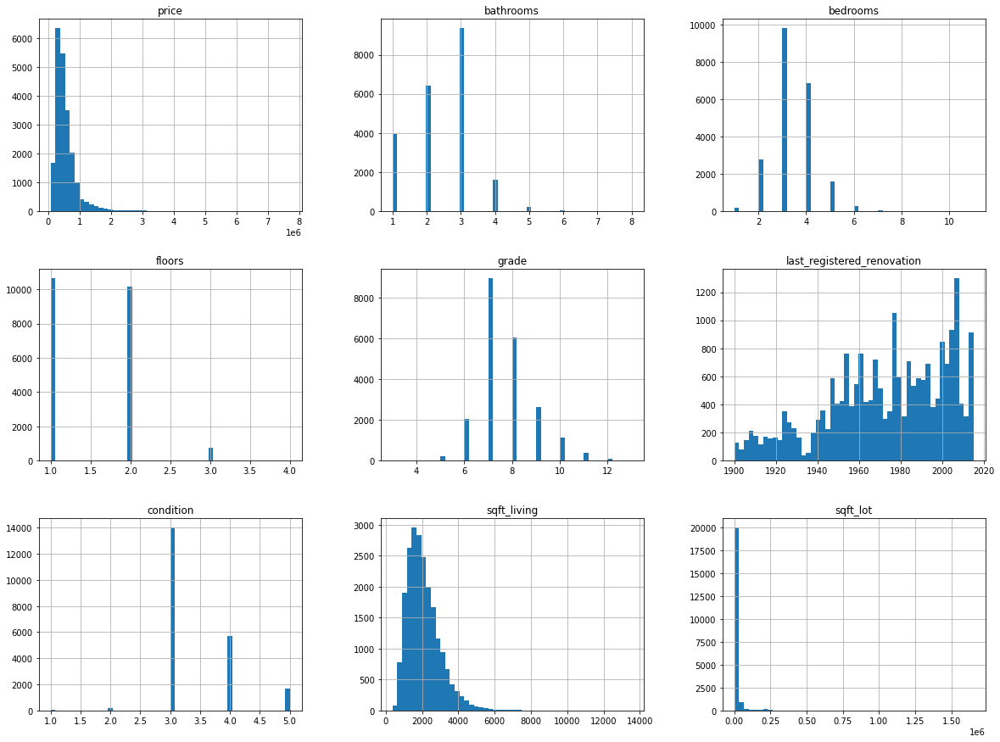

In [29]:
# Plotting of Histograms
kc_df[hist_columns].hist(bins=50, figsize = (20,15))
plt.show()

* Over 8000 houses have 3 bathrooms. This makes 3 bathrooms the moszt common value in our dataset <br>

* Most houses has 2 to 5 bedrooms, with again 3 bedrooms being the most common.
* Many of the houses in our dataset have 1 floor but also many houses have 2 floors. 3 floors is already a rarity among the houses in our dataset
* most of the houses has a rating between 6 and 10 of a scale from 1-13
* The conditions are also distributed fairly in general these are 3 to 4 so average - Some evidence of deferred maintenance and normal obsolescence with age in that a few minor repairs are needed to good - No obvious maintenance required but neither is everything new, there are also some that are very good so, all items well maintained but these are rare. It is very very rare that houses are in need of repair, i.e. have a condition of 1 or 2.
* The oldest house in our dataset is from 1900. between 1930 and 1940 very few houses were renovated probably related to the financial crisis and the beginning of the war. After that, more houses were built or renovated
* In term of price, we see a right-skewed distribution. From this we can conclude that there are more houses in King County that are affordable for normal working people and families than unaffordable houses for the groups where money is not an issue.
* Also the right skew at square foot living space clarifies that most of the apartments are normal sized and no big mansions

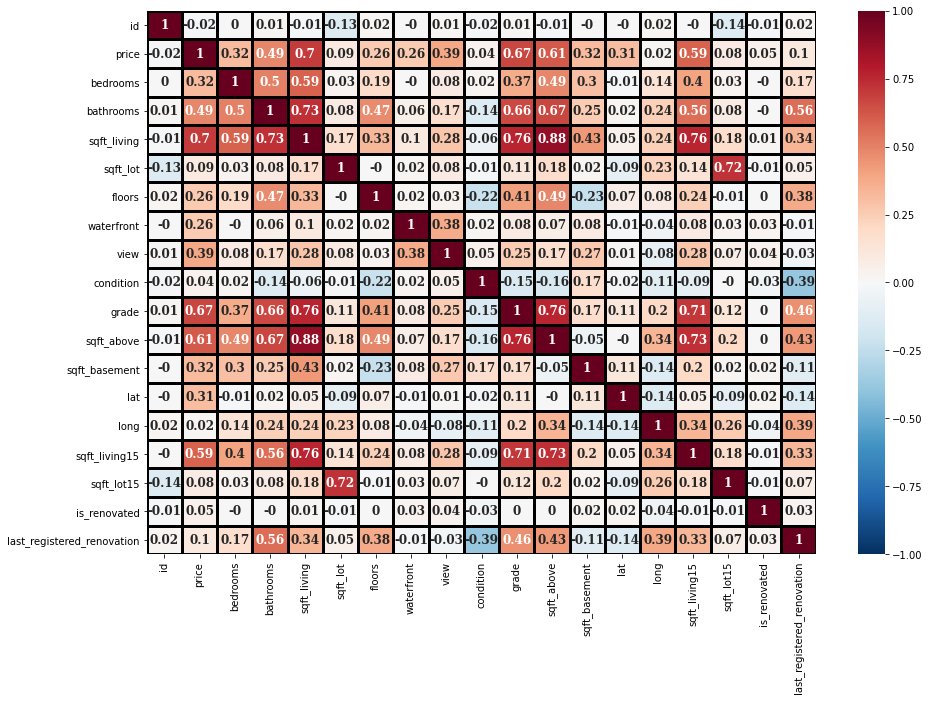

In [30]:
# Heatmap of the Pearson correlation coefficients to see releationships
plt.figure(figsize = (15,10))
sns.heatmap(round(kc_df.corr(), 2),cmap="RdBu_r"
            ,vmin = -1,vmax = 1, annot=True,
            linewidths=1.3,linecolor="black",
            annot_kws={"fontsize" : 12, 
                       "fontfamily" : "serif",
                       "fontweight" : "bold"});

* As we can see there is a correlation between price and sqft living 
* However, there is also a positive correlation between the size of the house and their rating aswell as the price and the grade
* The larger the living area, the larger the upstairs instead of the basement, which does not really correlate with the other variables regarding the size of the house.

### Hypotheses

* The closer a house is to the city center, the higher the price?
* What zip codes have seen the most price increase over time?
* If a house is located to water, then the price is higher?
  * how many houses are available
  * are the houses in the rich neighborhoods
* If a house is renovated the grades increase?
* Does having a higher grade translate to a higher price?
* Does an old building apartment which has been renovated get a higher grade than a new building apartment?
* Is a new build apartment in average more expensive than an old build apartment
* Does an old building apartment which has been renovated get a higher grade than a new building apartment?
* Got an expensive apartment more rooms,floors,space and has good conditions?
* Ranking for the best location to show off

___

__1. The closer a house is to the city center, the higher the price?__

In [31]:
# We create a new variable that gives us the price per square foot of living space
kc_df = kc_df.eval("price_per_sqft_of_living_space = price/(sqft_living + sqft_lot)").round(2)

In [32]:
# creating a DataFrame with the avarage price_per_square_living grouped by zipcode for mapping to get a better overview
df_zipcode = kc_df.groupby("zipcode").mean().sort_values("price_per_sqft_of_living_space").reset_index()
# import new data to get the district name for every zip code
zip_name= pd.read_excel("data/zip_code_names.xlsx")
# join the new df to the zipcode df
df_zipcode = pd.merge(zip_name,df_zipcode,how="inner",on="zipcode")
# check if everything works
df_zipcode

,zipcode,city,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,...,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,is_renovated,last_registered_renovation,price_per_sqft_of_living_space
0,98001,Algona,4651273623.072,281194.870,3.393,2.321,1903.784,14967.003,1.457,0.000,...,7.296,1723.756,180.028,47.309,-122.270,1830.100,11218.875,0.224,1981.371,24.089
1,98001,Auburn,4651273623.072,281194.870,3.393,2.321,1903.784,14967.003,1.457,0.000,...,7.296,1723.756,180.028,47.309,-122.270,1830.100,11218.875,0.224,1981.371,24.089
2,98001,Federal Way,4651273623.072,281194.870,3.393,2.321,1903.784,14967.003,1.457,0.000,...,7.296,1723.756,180.028,47.309,-122.270,1830.100,11218.875,0.224,1981.371,24.089
3,98002,Auburn,4850894131.724,234284.035,3.327,2.090,1627.744,7517.633,1.382,0.000,...,6.693,1522.538,105.206,47.309,-122.214,1479.030,7585.482,0.196,1968.925,28.499
4,98003,Auburn,4674181960.679,294111.279,3.357,2.375,1928.882,10603.096,1.325,0.000,...,7.543,1663.550,259.118,47.316,-122.309,1876.196,9746.179,0.150,1977.257,26.225
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101,98198,Des Moines,5152291468.886,302896.739,3.182,2.046,1745.361,10525.979,1.264,0.032,...,7.104,1476.254,261.929,47.391,-122.316,1711.571,9478.596,0.189,1968.211,28.826
102,98198,Normandy Park,5152291468.886,302896.739,3.182,2.046,1745.361,10525.979,1.264,0.032,...,7.104,1476.254,261.929,47.391,-122.316,1711.571,9478.596,0.189,1968.211,28.826
103,98198,Seatac,5152291468.886,302896.739,3.182,2.046,1745.361,10525.979,1.264,0.032,...,7.104,1476.254,261.929,47.391,-122.316,1711.571,9478.596,0.189,1968.211,28.826
104,98198,Seattle,5152291468.886,302896.739,3.182,2.046,1745.361,10525.979,1.264,0.032,...,7.104,1476.254,261.929,47.391,-122.316,1711.571,9478.596,0.189,1968.211,28.826


In [33]:
# load the geojson for mapping 
with open("data/Zipcodes_for_King_County_and_Surrounding_Area___zipcode_area.geojson") as f:
    gj = geojson.load(f)
# To look what we want to get for the mapping we need only the zipcodes from the geojson
gj["features"][0]["properties"]["ZIPCODE"]
# loop through the geojson to get the zipcodes
for i in range(len(gj["features"])):
    gj["features"][i]["id"] = gj["features"][i]["properties"]["ZIPCODE"]

In [34]:
# Build a geoplot to show the cheap and expensive area in King county
fig = px.choropleth_mapbox(df_zipcode,geojson=gj, locations="zipcode",color="price_per_sqft_of_living_space",
                           color_continuous_scale="amp",
                           range_color=(0,250),
                           mapbox_style="open-street-map",
                           zoom=8, center={"lat": 47.373348, "lon": -122.036926},
                           opacity=0.7, 
                           labels={'price_per_sqft_of_living_space':'Price per square foot of living'},
                           hover_name="city")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update_geos(fitbounds="locations", visible=False,center={"lat": 47.47, "lon": 47.47 -121.84})
fig.show()

In the west but also especially towards the center of King County it is getting more and more expensive, with Medina we have the most expensive neighborhood in average price per square living. Since it is mostly in cities so, however, there is also at the same time on the water, it is understandable. In the south are the more affordable neighborhoods, just on the edge of King County in the Federal Way neighborhood. The rest of the city is then again more expensive in the east and southeast, the houses are still in an affordable framework to the northeast, then they are markedly getting more expensive again.

__2. What zip codes have seen the most price increase over time?__

Zipcodes cluster houses in a designated geographical area. Certain zipcodes may include desirebale factors when looking for a home such as good schools, parks, services, and recreational activities. Hence, zipcodes might be a significant factor when determining house prices. This will help uncover which zipcodes have experienced gentrification or a major development.

In [35]:
zipcodes = kc_df.zipcode.astype(int).unique()

#How many different zipcodes there are.
print("Number of unique zipcodes:", zipcodes.shape[0])
#Get date of earliest transaction
print("Earliest Transaction date:", kc_df.date.min())
#Get date of latest transaction
print('Latest transaction date: ',kc_df.date.max())

Number of unique zipcodes: 70
Earliest Transaction date: 2014-05-02 00:00:00
Latest transaction date:  2015-05-27 00:00:00


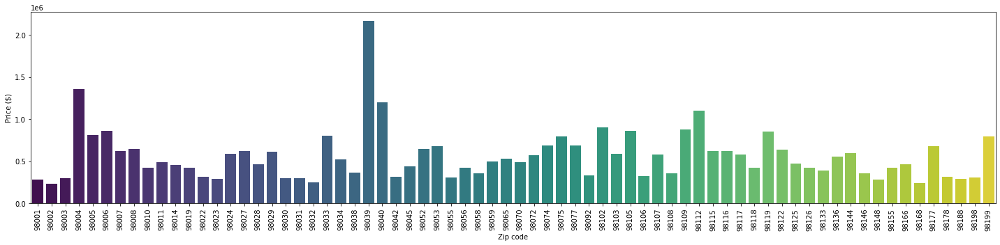

In [36]:
plt.figure(figsize=(20,5))
sns.barplot(x = 'zipcode', y= 'price', data = kc_df, palette = 'viridis',ci = False)
plt.xticks(rotation = 90)
plt.tight_layout()
plt.xlabel('Zip code')
plt.ylabel('Price ($)')
plt.show()

The dataset contains 70 different zip codes and transactions over a 13-month period, starting in May 2014. Given this information, I start by grouping transactions on a monthly basis to be able to compare monthly average price changes between zip codes over the course of a year.

In [37]:
# create a dataframe with only the needed rows
df_months = kc_df[['date','price','zipcode']].copy()
#normalize day to the beginning of month.
df_months['YearMonth'] = df_months['date'] + pd.offsets.MonthBegin(1)
df_months['YearMonth'] = df_months['date'].map(lambda dt: dt.replace(day=1))
df_months.drop('date',axis=1, inplace=True)

deltas_dict = {}
for zipcode in zipcodes:
    #Create temporary dataframe with transactions at a certain zipcode
    df_temp = df_months[df_months['zipcode']== zipcode].copy()
    #Get median value of the transactions per month. Median values are used to offset outlier effects.
    df_temp = df_temp.groupby('YearMonth').price.median()
    #Create a list to store month to month price changes.
    month_delta = []
    for i in range(len(df_temp)-1):
        #Calculate month to month change in median prices.
        delta = (df_temp[i+1]- df_temp[i])/df_temp[i]
        month_delta.append(delta)
    month_delta = np.array(month_delta)
    #Calculate monthly average price change as percentage.
    delta = round(month_delta.mean()*100,2)
    deltas_dict[zipcode] = delta
#Create dataframe 
df_deltas = pd.DataFrame.from_dict(deltas_dict,orient='index', columns=['m_delta'])
#Top 5 zipcodes.
print('The top 5 zipcodes are: ', list(df_deltas.sort_values('m_delta', axis=0, ascending=False).index[:5]))
df_deltas.sort_values('m_delta', axis=0, ascending=False).head()

The top 5 zipcodes are:  [98024, 98014, 98112, 98006, 98022]


,m_delta
98024,9.830
98014,6.620
98112,6.430
98006,5.050
98022,4.810


From the table we get the top 5 zipcodes with the highest percentage price increase per month. I will plot the median house prices for each of the top 5 zipcodeas, to compare and visualize what is happening to house prices over the course of the 13 months.

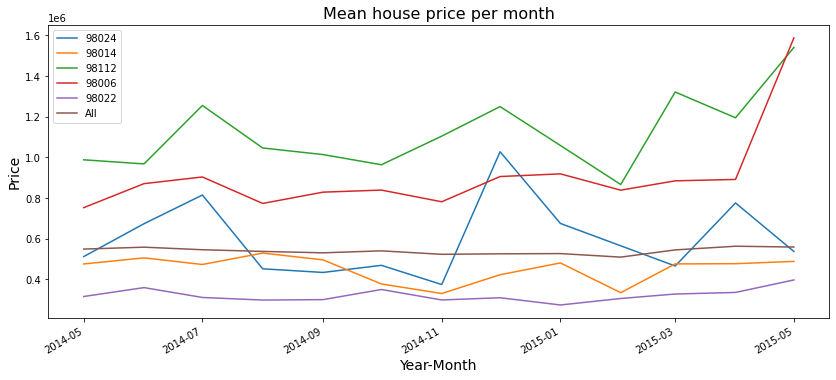

In [38]:
#Create list of top 5 zipcodes
top5_zip= list(df_deltas.sort_values('m_delta', axis=0, ascending=False).index[:5])
#Create figure 
fig = plt.figure(figsize=(14,6))
for zipcode in top5_zip:
    df_temp = df_months[df_months['zipcode']== zipcode].copy()
    df_temp = df_temp.groupby('YearMonth').price.mean()
    df_temp.plot(label=zipcode, legend=True)
df_temp = df_months.groupby('YearMonth').price.mean()
df_temp.plot(label='All', legend=True)
plt.title('Mean house price per month',fontsize=16)
plt.xlabel('Year-Month', fontsize=14)
plt.ylabel('Price', fontsize=14)
plt.show();

House prices remain quite stable overall. The mean price of a home at the begining of the period is not much different from the final prices, resulting in no real returns. However, individual zipcodes appear to be more volatile through time. Since we are just looking at expensive houses just zipcode 98112 and 98006 into the picture apart from having high average price increases per month, they also show a high increase from their begining values. zipcodes have somewhat defined price floors and ceilings, meaning houses from the same zipcode share similar characteristics amongst each other.



__3. If a house is located to water, then the price is higher?__
  * how many houses are available
  * are the houses in the rich neighborhoods

In [39]:
kc_df.waterfront.value_counts()

0    21450
1      146
Name: waterfront, dtype: int64

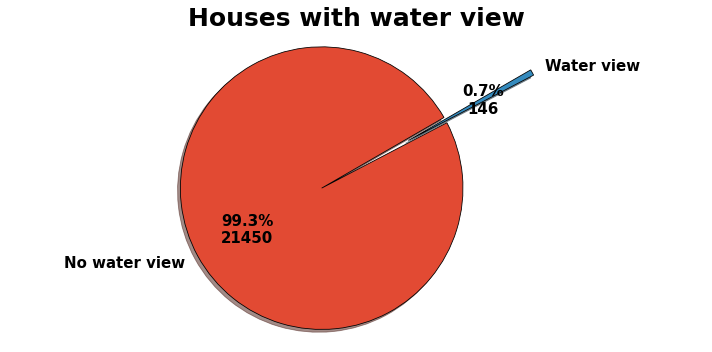

In [40]:

plt.style.use('ggplot')
plt.figure(figsize=(10,5))
explode = [0,0.7]
size = [21450,146]
label = ["No water view","Water view"]
# function to geht the % Values as the counted values
def func(pct, allvals):
    absolute = int(np.round(pct/100.*np.sum(allvals)))
    return "{:.1f}%\n{:d}".format(pct, absolute)

#create the pie charts
plt.pie(size,autopct=lambda pct: func(pct, size),labels=label,
        shadow=True, startangle=30,
        textprops=dict(color="black",fontweight="bold",size=15), explode=explode,
        wedgeprops = { 'linewidth' : 0.8,'edgecolor' : "black" })
plt.axis('equal')
plt.title("Houses with water view",fontweight="bold",fontsize=25)
plt.tight_layout();

In [41]:
# Only get houses with water view
water = kc_df.query("waterfront >= 1")

In [42]:

fig = px.scatter_mapbox(water, lat="lat", lon="long",
                  color_continuous_scale="bluered", 
                  size_max=10, zoom=8, 
                  color="price", size="price")
fig.update_layout(mapbox_style="open-street-map",title="Houses with Water view",title_font_size= 30)
fig.show()

__3. How many renovations occurred? Are only expensive houses and near center renovate?__

In [66]:

renovate_group_w = water.groupby(by=["is_renovated"])
renovate_freq_w = renovate_group_w.size()

In [67]:
renovate_freq_w

is_renovated
0    92
1    54
dtype: int64

In [ ]:
renovate_group = kc_df.groupby(by=["is_renovated"])
renovate_freq = renovate_group.size()

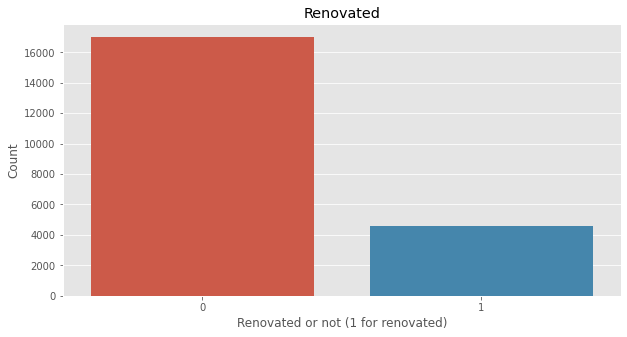

In [75]:
fig, ax = plt.subplots(figsize=(10,5))
renovate_freq_plot = sns.barplot(renovate_freq.index, renovate_freq.values)
renovate_freq_plot.set(xlabel="Renovated or not (1 for renovated)", ylabel="Count", title="Renovated")
plt.show()

Based off this chart, we can see that renovations were fairly rare for this county.

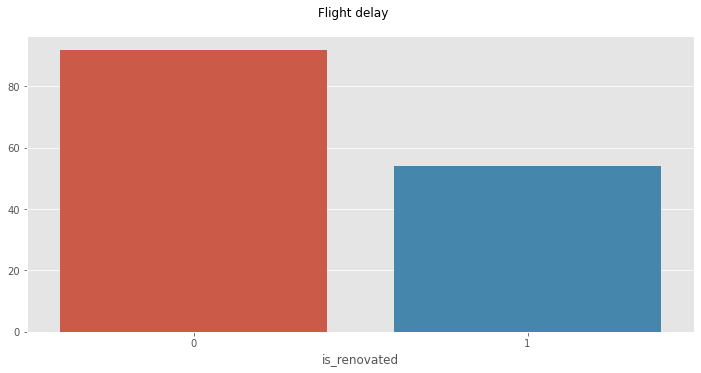

In [74]:
# As Subplots
fig, ax = plt.subplots(figsize=(10,5))
fig.tight_layout(h_pad=4)

fig.suptitle('Flight delay')
plt.subplots_adjust(top=0.90)

sns.barplot(x =renovate_freq_w.index, y = renovate_freq_w.values);

In [78]:
water_reno = water.query("is_renovated==1")

In [82]:
fig = px.scatter_mapbox(water_reno, lat="lat", lon="long",
                  color_continuous_scale="bluered", 
                  size_max=10, zoom=8, 
                  color="price", size="price")
fig.update_layout(mapbox_style="open-street-map",title="Houses with Water view and renovated",title_font_size= 30)
fig.show()

As we can see we now own 54 houses which are eligible. But these are not all expensive as expected and not necessarily in the city center.

Create Grouping from grade based on the documentation
1 - 5 low quality construction & design
6 - 10 average quality consturction & design
11 - 13 high quality of construction & design

In [44]:
bin_quality =[1,5,10,13]
label = ['Low', 'Average', 'High']

kc_df['Quality'] = pd.cut(df['grade'], bins = bin_quality, labels = label)
df.head()

NameError: name 'df' is not defined

In [ ]:
plt.figure(figsize = (15 , 7))
sns.countplot(df['Quality'])
plt.title('Quality of the Houses')
plt.show()

In [ ]:
# House with high Quality has 3x the average value of house with average quality and almost 7 X the average value of house with low quality
plt.figure(figsize = (20, 8))
sns.barplot(x = 'Quality', y='price', data = df, ci = False, palette = 'viridis')
plt.title('Average Prices Per Quality')